In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
from pathlib import Path
import os
import pandas as pd
from tqdm.auto import tqdm
import cartopy.crs as ccrs
import cmocean
from pyproj import Transformer
import harmonica as hm

In [5]:
bm1path = Path('D:/bedmap/BEDMAP1')
bm2path = Path('D:/bedmap/BEDMAP2')
bm3path = Path('D:/bedmap/BEDMAP3')

### BM1

In [6]:
bm1 = pd.read_csv(Path('D:/bedmap/BEDMAP1/BEDMAP1_1966-2000_AIR_BM1.csv'), header=18)
bm1['bm'] = np.ones(bm1.shape[0])
bm1

,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),bedrock_altitude (m),two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),bm
0,1,-9999,4.44900,-75.62300,-9999,-9999,-9999.0,2650.0,-9999.0,-9999,-9999,-9999,1.0
1,2,-9999,4.43800,-75.62100,-9999,-9999,-9999.0,2628.0,-9999.0,-9999,-9999,-9999,1.0
2,3,-9999,4.42500,-75.61900,-9999,-9999,-9999.0,2620.0,-9999.0,-9999,-9999,-9999,1.0
3,4,-9999,4.42000,-75.61900,-9999,-9999,-9999.0,2635.0,-9999.0,-9999,-9999,-9999,1.0
4,5,-9999,4.40700,-75.61700,-9999,-9999,-9999.0,2646.0,-9999.0,-9999,-9999,-9999,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1905045,1905046,-9999,-53.79618,-83.97787,-9999,-9999,1350.0,779.0,-9999.0,-9999,-9999,-9999,1.0
1905046,1905047,-9999,-53.81247,-83.98000,-9999,-9999,1346.0,756.0,-9999.0,-9999,-9999,-9999,1.0
1905047,1905048,-9999,-53.88616,-83.98947,-9999,-9999,1342.0,941.0,-9999.0,-9999,-9999,-9999,1.0
1905048,1905049,-9999,-53.90617,-83.99211,-9999,-9999,1343.0,705.0,-9999.0,-9999,-9999,-9999,1.0


### BM2

In [7]:
total = 0
for item in os.scandir(bm2path):
    if item.name.endswith('.csv'):
        total += 1

dfs = []

for i, item in tqdm(enumerate(os.scandir(bm2path)), total=total):
    if item.name.endswith('.csv'):
        print(item.path)
        # if i==0:
        #     df = pd.read_csv(item.path, header=18)
        dfs.append(pd.read_csv(item.path, header=18))

bm2 = pd.concat(dfs)
bm2['bm'] = np.full(bm2.shape[0], 2.0)
bm2

  0%|          | 0/66 [00:00<?, ?it/s]

D:\bedmap\BEDMAP2\AWI_1994_DML1_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_1995_DML2_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_1996_DML3_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_1997_DML4_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_1998_DML5_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2000_DML6_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2001_DML7_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2002_DML8_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2003_DML9_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2004_DML10_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2005_ANTSYSO_AIR_BM2.csv
D:\bedmap\BEDMAP2\AWI_2007_ANTR_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_1994_Evans_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_1998_Dufek_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2001_Bailey-Slessor_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2001_MAMOG_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2001_TORUS_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2004_BBAS_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2005_WISE-ISODYN_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2006_GRADES-IMAGE_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2007_AGAP_AIR_BM2.csv
D:\bedmap\BEDMAP2\BAS_2007_TIGRIS_GRN_BM2.c

,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),bedrock_altitude (m),two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),bm
0,1,-9999,-10.388000,-75.499000,-9999,-9999,-9999.00,1472.70,-9999.000,-9999.0,-9999,-9999,2.0
1,2,-9999,-10.377000,-75.503000,-9999,-9999,-9999.00,1492.90,-9999.000,-9999.0,-9999,-9999,2.0
2,3,-9999,-10.371000,-75.505000,-9999,-9999,-9999.00,1482.90,-9999.000,-9999.0,-9999,-9999,2.0
3,4,-9999,-10.362000,-75.508000,-9999,-9999,-9999.00,1524.10,-9999.000,-9999.0,-9999,-9999,2.0
4,5,-9999,-10.357000,-75.510000,-9999,-9999,-9999.00,1565.80,-9999.000,-9999.0,-9999,-9999,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072806,1072807,-9999,111.816853,-74.536179,-9999,-9999,3081.03,4086.52,-1005.490,-9999.0,-9999,-9999,2.0
1072807,1072808,-9999,111.816356,-74.536312,-9999,-9999,3085.79,4064.74,-978.955,-9999.0,-9999,-9999,2.0
1072808,1072809,-9999,111.815862,-74.536445,-9999,-9999,3083.94,4077.10,-993.160,-9999.0,-9999,-9999,2.0
1072809,1072810,-9999,111.815371,-74.536580,-9999,-9999,3083.01,4069.90,-986.887,-9999.0,-9999,-9999,2.0


In [8]:
total = 0
for item in os.scandir(bm3path):
    if item.name.endswith('.csv'):
        total += 1

dfs = []

for i, item in tqdm(enumerate(os.scandir(bm3path)), total=total):
    if item.name.endswith('.csv'):
        print(item.path)
        # if i==0:
        #     df = pd.read_csv(item.path, header=18)
        dfs.append(pd.read_csv(item.path, header=18))

bm3 = pd.concat(dfs)
bm3['bm'] = np.full(bm3.shape[0], 3.0)
bm3

  0%|          | 0/84 [00:00<?, ?it/s]

D:\bedmap\BEDMAP3\AWI_2013_GEA-IV_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2014_Recovery-Glacier_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2015_GEA-DML_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2016_OIR_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2018_ANIRES_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2018_DML-Coast_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2018_JURAS_AIR_BM3.csv
D:\bedmap\BEDMAP3\AWI_2019_JURAS_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2007_Lake-Ellsworth_GRN_BM3.csv
D:\bedmap\BEDMAP3\BAS_2007_Rutford_GRN_BM3.csv
D:\bedmap\BEDMAP3\BAS_2008_Lake-Ellsworth_GRN_BM3.csv
D:\bedmap\BEDMAP3\BAS_2010_IMAFI_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2011_Adelaide_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2012_Castle_GRN_BM3.csv
D:\bedmap\BEDMAP3\BAS_2012_ICEGRAV_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2013_ISTAR_GRN_BM3.csv
D:\bedmap\BEDMAP3\BAS_2015_FISS_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2015_POLARGAP_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2016_FISS_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2017_English-Coast_AIR_BM3.csv
D:\bedmap\BEDMAP3\BAS_2018_Thwaites_AIR_BM3.csv


C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))
C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))


D:\bedmap\BEDMAP3\RNRF_2011_RAE_AIR_BM3.csv
D:\bedmap\BEDMAP3\RNRF_2013_RAE_AIR_BM3.csv


C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0,5) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))


D:\bedmap\BEDMAP3\RNRF_2014_RAE_AIR_BM3.csv
D:\bedmap\BEDMAP3\RNRF_2015_RAE_AIR_BM3.csv


C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))
C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))


D:\bedmap\BEDMAP3\RNRF_2016_RAE_AIR_BM3.csv
D:\bedmap\BEDMAP3\RNRF_2017_RAE_AIR_BM3.csv


C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))
C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))


D:\bedmap\BEDMAP3\RNRF_2018_RAE_AIR_BM3.csv
D:\bedmap\BEDMAP3\RNRF_2019_RAE_AIR_BM3.csv


C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))
C:\Users\mjfie\AppData\Local\Temp\ipykernel_8776\231301694.py:13: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(item.path, header=18))


D:\bedmap\BEDMAP3\STANFORD_1971_SPRI-NSF-TUD_AIR_BM3.csv
D:\bedmap\BEDMAP3\ULB_2012_BEWISE_GRN_BM3.csv
D:\bedmap\BEDMAP3\ULB_2012_ICECON_GRN_BM3.csv
D:\bedmap\BEDMAP3\UTIG_2009_Darwin-Hatherton_AIR_BM3.csv
D:\bedmap\BEDMAP3\UTIG_2010_ICECAP_AIR_BM3.csv
D:\bedmap\BEDMAP3\UTIG_2013_GIMBLE_AIR_BM3.csv
D:\bedmap\BEDMAP3\UTIG_2015_EAGLE_AIR_BM3.csv
D:\bedmap\BEDMAP3\UTIG_2016_OLDICE_AIR_BM3.csv
D:\bedmap\BEDMAP3\UWASHINGTON_2018_South-Pole-Lake_GRN_BM3.csv


,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),bedrock_altitude (m),two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),bm
0,-9999,5677,27.270100,-73.084496,2014-12-30,-9999,-9999.000000,1384.300000,-9999.000000,-9999.000000,-9999.0,-9999.000000,3.0
1,-9999,5681,27.271099,-73.085701,2014-12-30,-9999,-9999.000000,1411.900000,-9999.000000,-9999.000000,-9999.0,-9999.000000,3.0
2,-9999,5685,27.272098,-73.086800,2014-12-30,-9999,-9999.000000,1434.000000,-9999.000000,-9999.000000,-9999.0,-9999.000000,3.0
3,-9999,5689,27.273100,-73.087997,2014-12-30,-9999,-9999.000000,1459.900000,-9999.000000,-9999.000000,-9999.0,-9999.000000,3.0
4,-9999,5693,27.274099,-73.089096,2014-12-30,-9999,-9999.000000,1493.500000,-9999.000000,-9999.000000,-9999.0,-9999.000000,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58396,15.0,-9999,-133.157914,-89.909184,2019-02-04,05:25:29,2809.073374,2915.797188,-106.723814,0.000034,-9999.0,16366.193146,3.0
58397,15.0,-9999,-133.147029,-89.909205,2019-02-04,05:25:30,2809.122107,2916.219688,-107.097582,0.000034,-9999.0,16369.262730,3.0
58398,15.0,-9999,-133.136578,-89.909227,2019-02-04,05:25:31,2809.127845,2916.642188,-107.514344,0.000034,-9999.0,16372.332685,3.0
58399,15.0,-9999,-133.126111,-89.909249,2019-02-04,05:25:32,2809.132123,2917.064688,-107.932566,0.000034,-9999.0,16375.402432,3.0


In [9]:
del(dfs)

In [10]:
bm1 = bm1.replace(-9999, np.nan)
bm2 = bm2.replace(-9999, np.nan)
bm3 = bm3.replace(-9999, np.nan)

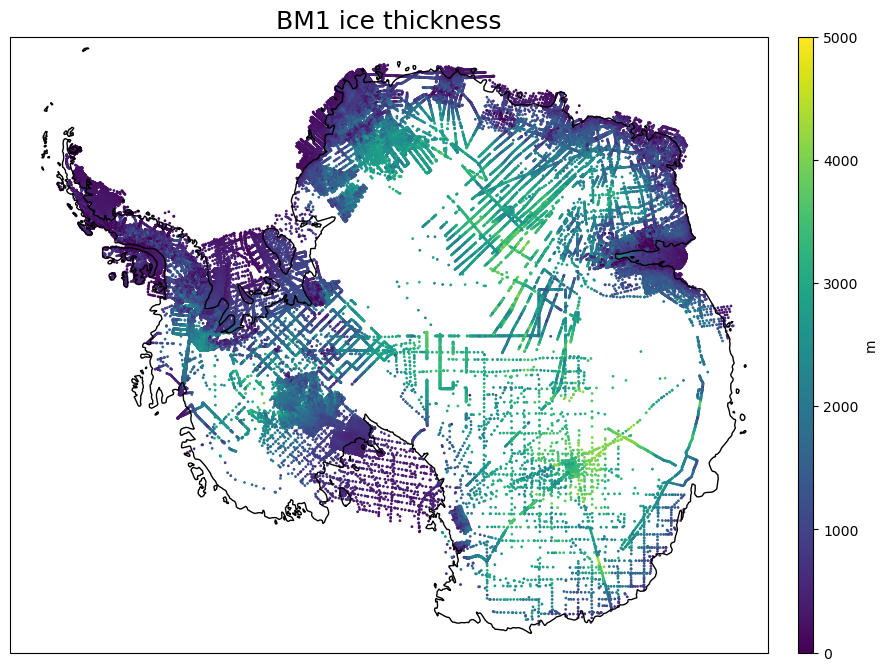

In [11]:
ps71 = ccrs.SouthPolarStereo(true_scale_latitude=-71)

fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(bm1['longitude (degree_east)'][::10], bm1['latitude (degree_north)'][::10], c=bm1['land_ice_thickness (m)'][::10], s=1, transform=ccrs.Geodetic(), vmax=5000)
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM1 ice thickness', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

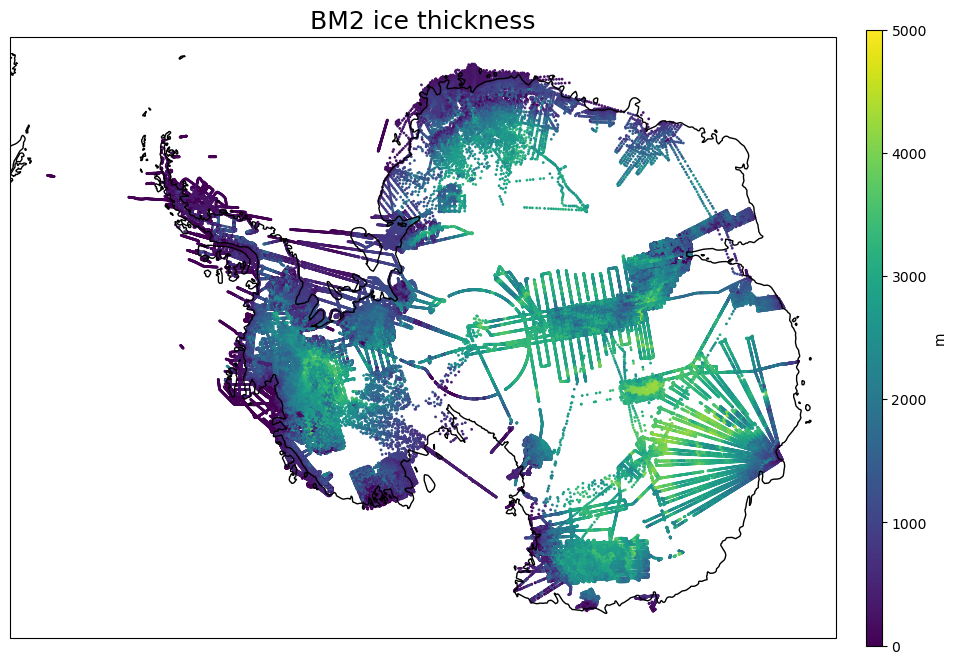

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(bm2['longitude (degree_east)'][::100], bm2['latitude (degree_north)'][::100], c=bm2['land_ice_thickness (m)'][::100], s=1, transform=ccrs.Geodetic(), vmax=5000)
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM2 ice thickness', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

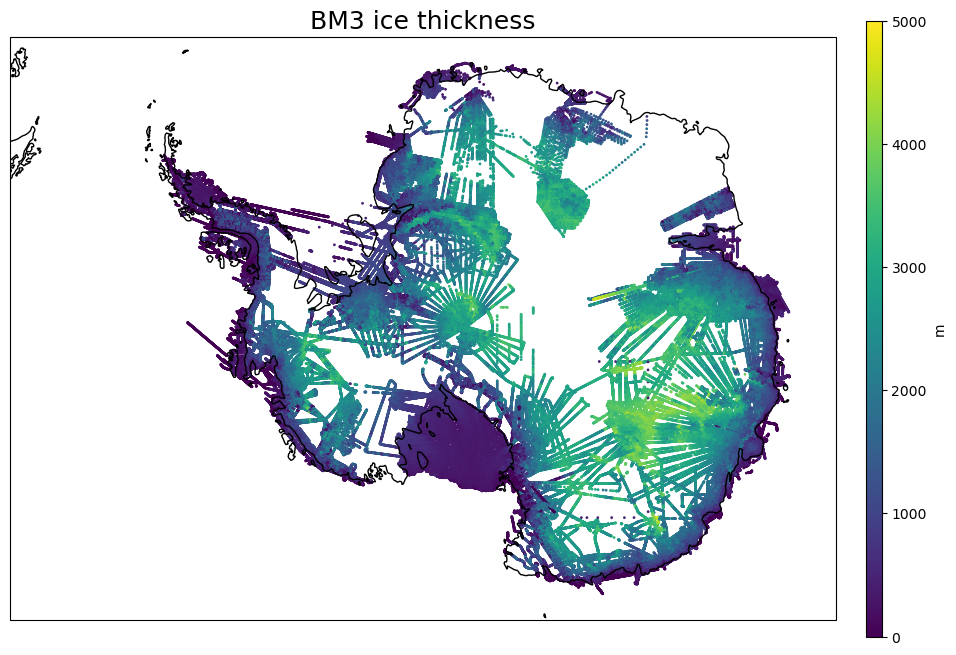

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(bm3['longitude (degree_east)'][::100], bm3['latitude (degree_north)'][::100], c=bm3['land_ice_thickness (m)'][::100], s=1, transform=ccrs.Geodetic(), vmax=5000)
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM3 ice thickness', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [14]:
bm1.isna().sum()

trajectory_id                     0
trace_number                1905050
longitude (degree_east)           0
latitude (degree_north)           0
date                        1905050
time_UTC                    1905050
surface_altitude (m)         945249
land_ice_thickness (m)            0
bedrock_altitude (m)        1287581
two_way_travel_time (m)     1905050
aircraft_altitude (m)       1905050
along_track_distance (m)    1905050
bm                                0
dtype: int64

In [15]:
bm2.isna().sum()

trajectory_id                1321487
trace_number                30968903
longitude (degree_east)            0
latitude (degree_north)            0
date                        16804574
time_UTC                    16806539
surface_altitude (m)         5208815
land_ice_thickness (m)       3157619
bedrock_altitude (m)         8315228
two_way_travel_time (m)     30504127
aircraft_altitude (m)       30968903
along_track_distance (m)    30504127
bm                                 0
dtype: int64

In [16]:
bm3.isna().sum()

trajectory_id                6867973
trace_number                49705768
longitude (degree_east)            0
latitude (degree_north)            0
date                         9133674
time_UTC                    13821168
surface_altitude (m)        11706932
land_ice_thickness (m)      10271464
bedrock_altitude (m)        21549585
two_way_travel_time (m)     51923394
aircraft_altitude (m)       42340805
along_track_distance (m)    51891179
bm                                 0
dtype: int64

In [17]:
print(bm1.shape)
print(bm2.shape)
print(bm3.shape)

(1905050, 13)
(30968903, 13)
(63018164, 13)


In [18]:
df = pd.concat([bm1, bm2, bm3])
df

,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),bedrock_altitude (m),two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),bm
0,1,NaN,4.449000,-75.623000,NaN,NaN,NaN,2650.000000,NaN,NaN,NaN,NaN,1.0
1,2,NaN,4.438000,-75.621000,NaN,NaN,NaN,2628.000000,NaN,NaN,NaN,NaN,1.0
2,3,NaN,4.425000,-75.619000,NaN,NaN,NaN,2620.000000,NaN,NaN,NaN,NaN,1.0
3,4,NaN,4.420000,-75.619000,NaN,NaN,NaN,2635.000000,NaN,NaN,NaN,NaN,1.0
4,5,NaN,4.407000,-75.617000,NaN,NaN,NaN,2646.000000,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58396,15.0,NaN,-133.157914,-89.909184,2019-02-04,05:25:29,2809.073374,2915.797188,-106.723814,0.000034,NaN,16366.193146,3.0
58397,15.0,NaN,-133.147029,-89.909205,2019-02-04,05:25:30,2809.122107,2916.219688,-107.097582,0.000034,NaN,16369.262730,3.0
58398,15.0,NaN,-133.136578,-89.909227,2019-02-04,05:25:31,2809.127845,2916.642188,-107.514344,0.000034,NaN,16372.332685,3.0
58399,15.0,NaN,-133.126111,-89.909249,2019-02-04,05:25:32,2809.132123,2917.064688,-107.932566,0.000034,NaN,16375.402432,3.0


In [19]:
del(bm1)
del(bm2)
del(bm3)

In [20]:
def geo2ant(lat, lon):
    """
    Converts geodetic coordinates to Antarctic Polar Stereographic

    Args:
        lat, lon : latitude and longitude arrays
    Outputs:
        x, y : coordinates in Antarctic Polar Stereographic
    """
    transformer = Transformer.from_crs(4326, 3031)
    x, y = transformer.transform(lat, lon)
    return x, y

In [21]:
x_coords, y_coords = geo2ant(df['latitude (degree_north)'], df['longitude (degree_east)'])
df['x'] = x_coords
df['y'] = y_coords

In [22]:
df.isna().sum()

trajectory_id                8189460
trace_number                82579721
longitude (degree_east)            0
latitude (degree_north)            0
date                        27843298
time_UTC                    32532757
surface_altitude (m)        17860996
land_ice_thickness (m)      13429083
bedrock_altitude (m)        31152394
two_way_travel_time (m)     84332571
aircraft_altitude (m)       75214758
along_track_distance (m)    84300356
bm                                 0
x                                  0
y                                  0
dtype: int64

In [23]:
msk = (df['land_ice_thickness (m)'].isna()==True) & (df['surface_altitude (m)'].isna()==False) & (df['bedrock_altitude (m)'].isna()==False)
df.loc[msk, 'land_ice_thickness (m)'] = df.loc[msk, 'surface_altitude (m)'] - df.loc[msk, 'bedrock_altitude (m)']
np.count_nonzero(msk)

92791

In [24]:
df.isna().sum()

trajectory_id                8189460
trace_number                82579721
longitude (degree_east)            0
latitude (degree_north)            0
date                        27843298
time_UTC                    32532757
surface_altitude (m)        17860996
land_ice_thickness (m)      13336292
bedrock_altitude (m)        31152394
two_way_travel_time (m)     84332571
aircraft_altitude (m)       75214758
along_track_distance (m)    84300356
bm                                 0
x                                  0
y                                  0
dtype: int64

In [25]:
df = df.loc[df['land_ice_thickness (m)'].isna()==False]

In [26]:
df.shape

(82555825, 15)

In [27]:
df.isna().sum()

trajectory_id                6810858
trace_number                71119462
longitude (degree_east)            0
latitude (degree_north)            0
date                        24896722
time_UTC                    29058217
surface_altitude (m)        16286483
land_ice_thickness (m)             0
bedrock_altitude (m)        17836132
two_way_travel_time (m)     70996283
aircraft_altitude (m)       63699512
along_track_distance (m)    71571452
bm                                 0
x                                  0
y                                  0
dtype: int64

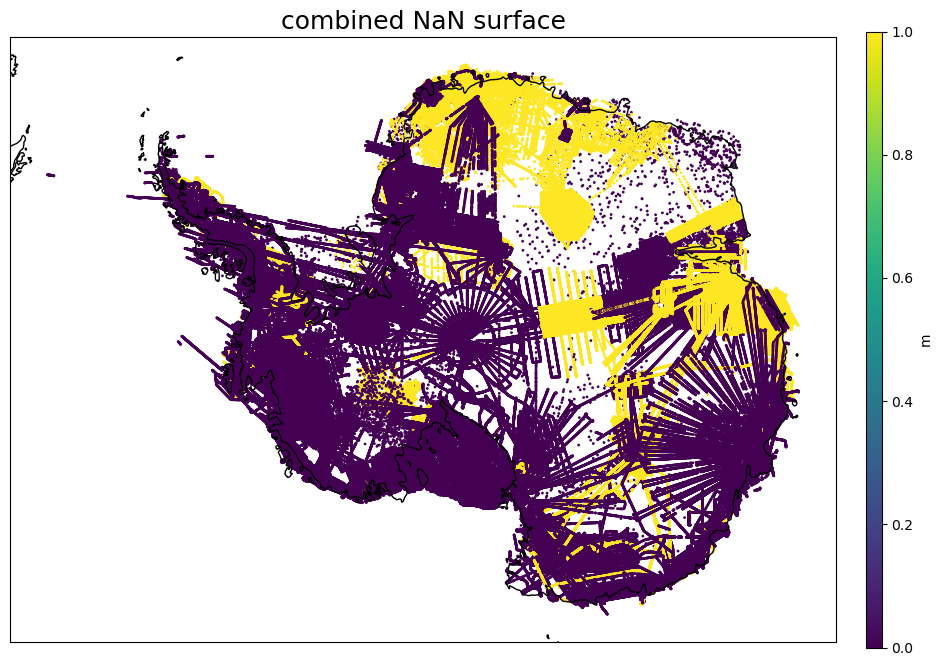

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['x'][::100], df['y'][::100], c=df['surface_altitude (m)'][::100].isna(), s=1)
ax.axis('scaled')
ax.coastlines()
ax.set_title('combined NaN surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

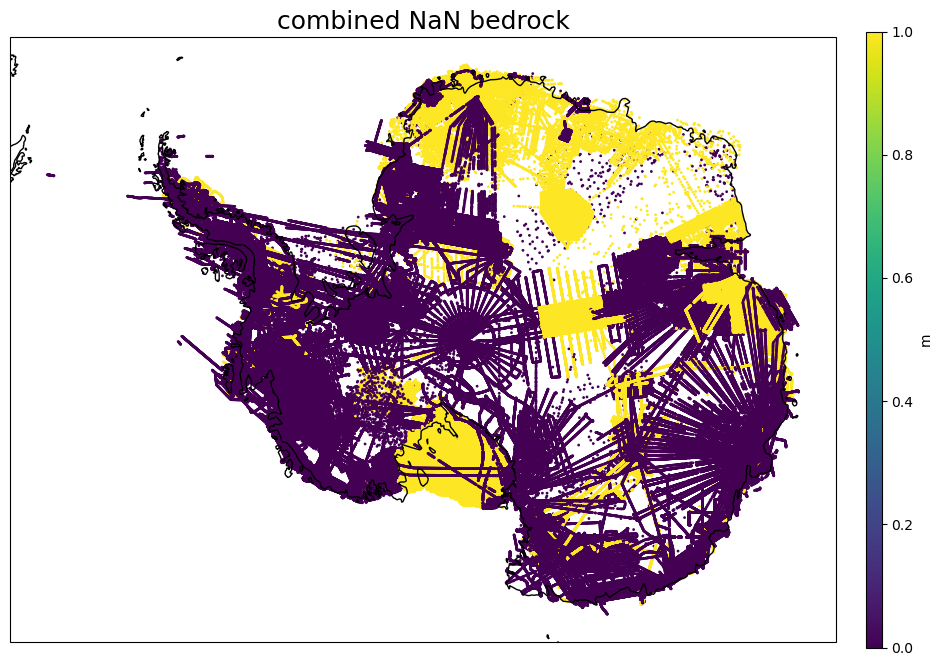

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=df['bedrock_altitude (m)'][::100].isna(), s=1, transform=ccrs.Geodetic())
ax.axis('scaled')
ax.coastlines()
ax.set_title('combined NaN bedrock', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

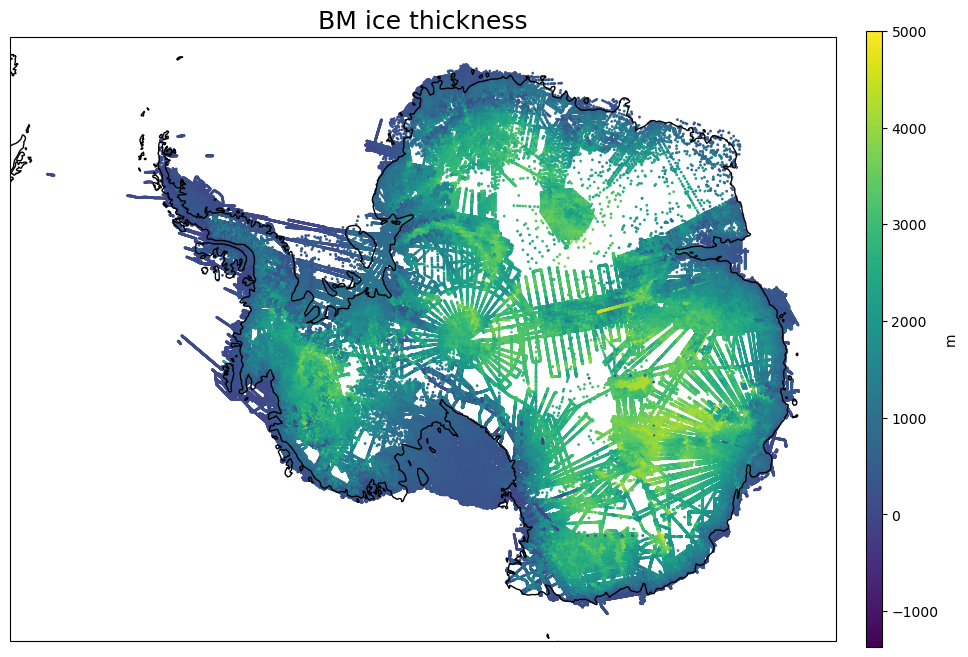

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=df['land_ice_thickness (m)'][::100], s=1, transform=ccrs.Geodetic(), vmax=5000)
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM ice thickness', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

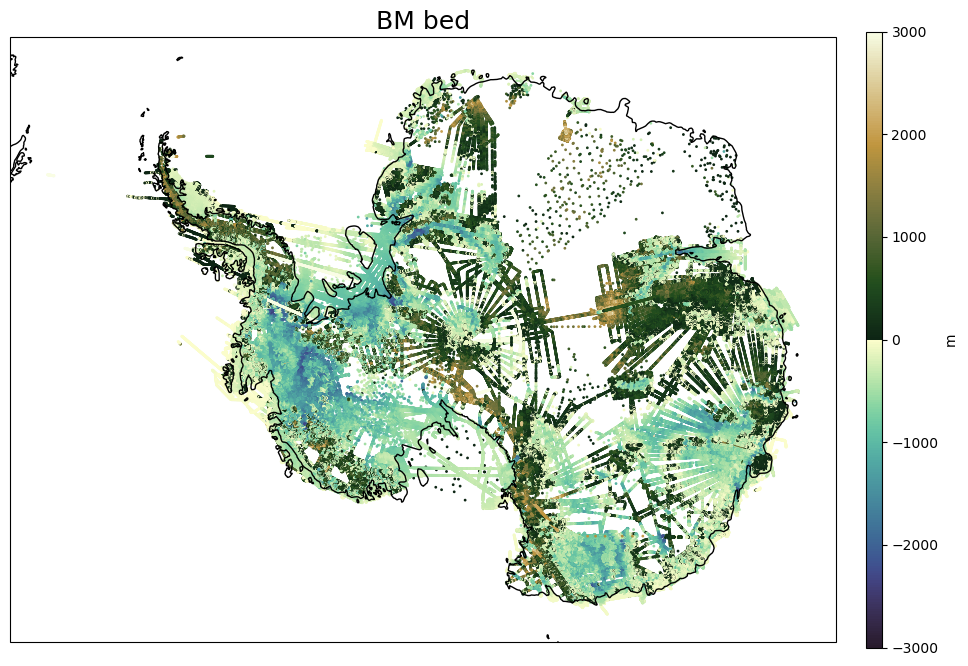

In [31]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=df['bedrock_altitude (m)'][::100], s=1, transform=ccrs.Geodetic(), vmin=-3000, vmax=3000, cmap='cmo.topo')
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM bed', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

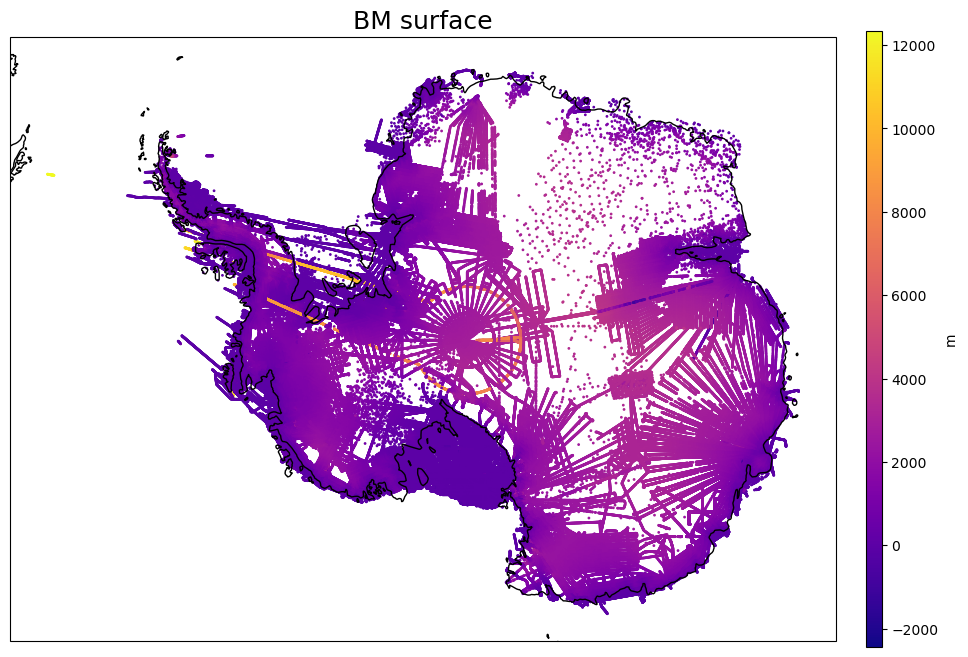

In [32]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=df['surface_altitude (m)'][::100], s=1, transform=ccrs.Geodetic(), cmap='plasma')
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

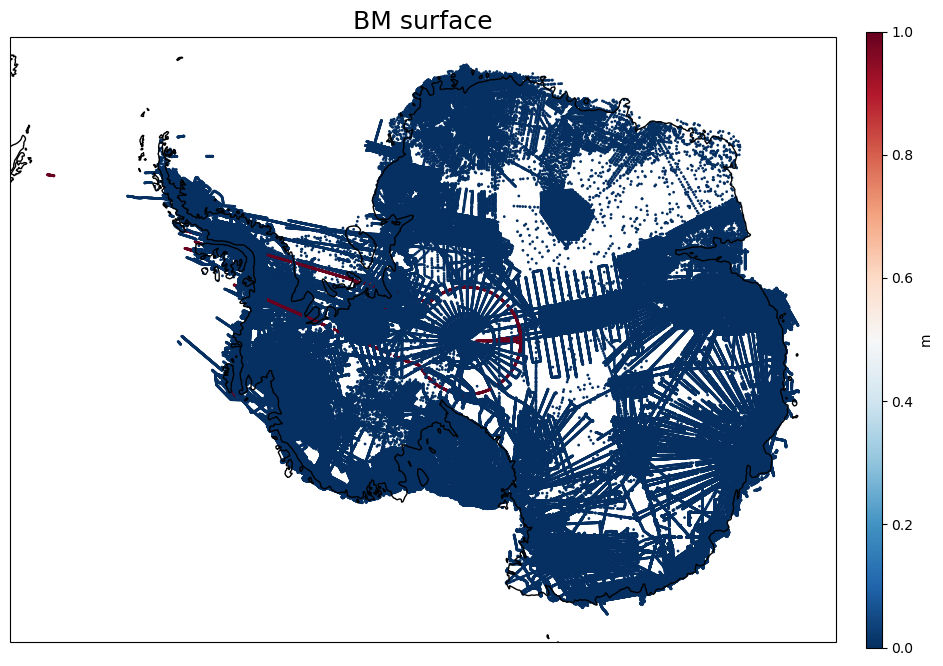

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=df['surface_altitude (m)'][::100]>5000, s=1, transform=ccrs.Geodetic(), cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

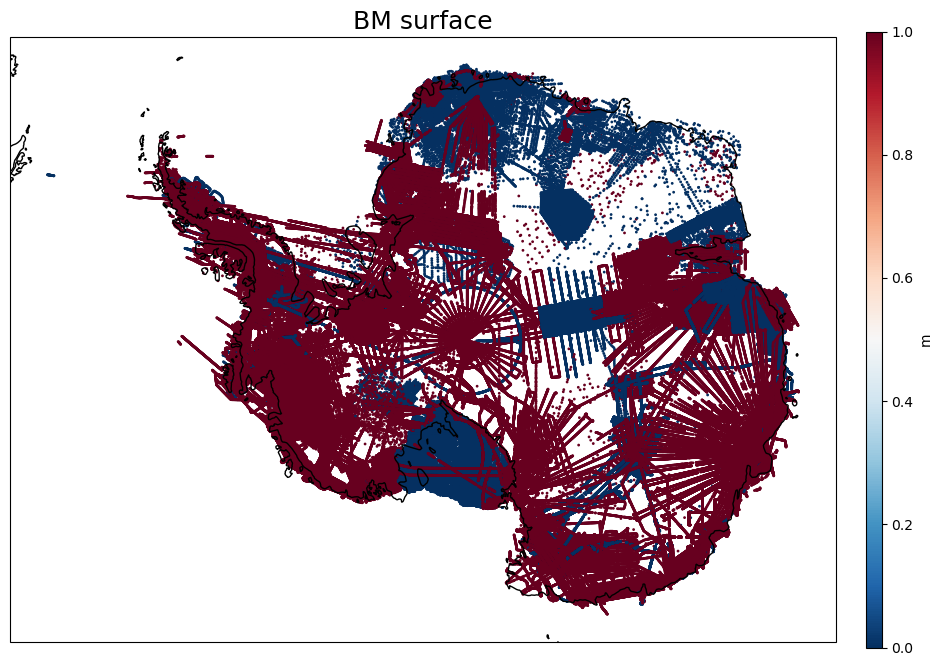

In [34]:
thing = (df['bedrock_altitude (m)'].values<5000) & (df['bedrock_altitude (m)'].values!=np.nan)

fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=thing[::100], s=1, transform=ccrs.Geodetic(), cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('BM surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [35]:
bad = (df['bedrock_altitude (m)'].isna()) | (df['surface_altitude (m)'].isna()) | (df['land_ice_thickness (m)'].isna())

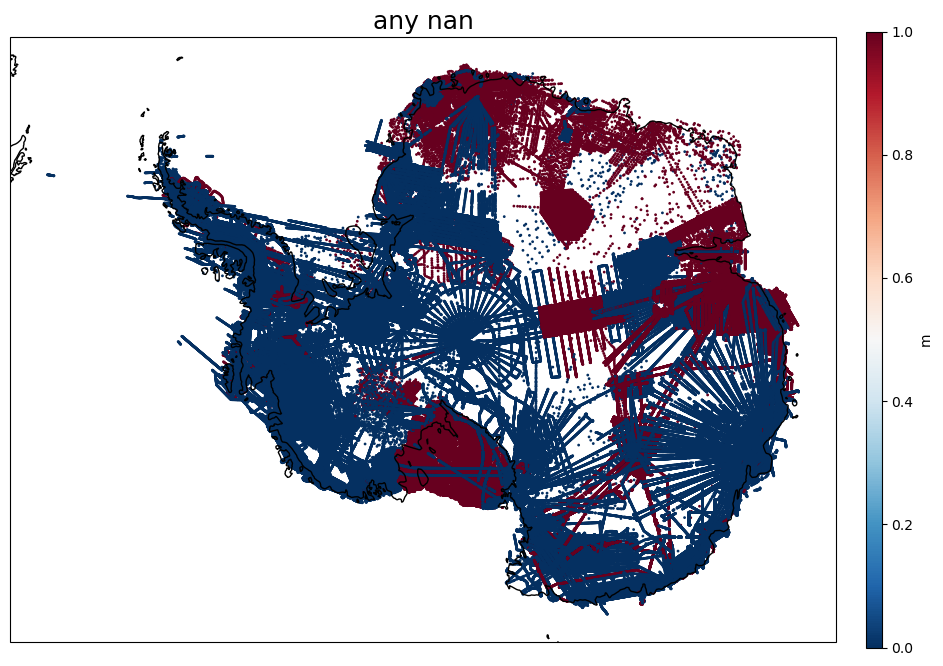

In [36]:
thing = (df['bedrock_altitude (m)'].values<5000) & (df['bedrock_altitude (m)'].values!=np.nan)

fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=bad[::100], s=1, transform=ccrs.Geodetic(), cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('any nan', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [37]:
x_coords = df.loc[df['surface_altitude (m)'].isna()==False, 'x']
y_coords = df.loc[df['surface_altitude (m)'].isna()==False, 'y']
surface_data = df.loc[df['surface_altitude (m)'].isna()==False, 'surface_altitude (m)']

trend = vd.Trend(3)

trend.fit((x_coords[::100], y_coords[::100]), surface_data[::100])
preds = trend.predict((df['x'], df['y']))

preds[preds < 0] = 0

preds.shape

(82555825,)

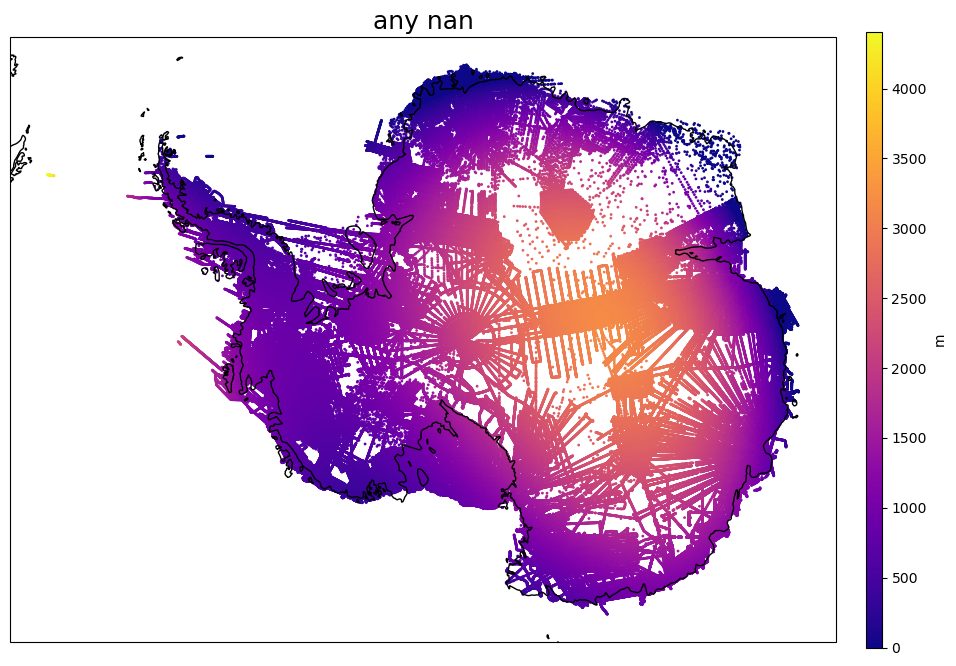

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=preds[::100], s=1, transform=ccrs.Geodetic(), cmap='plasma')
ax.axis('scaled')
ax.coastlines()
ax.set_title('any nan', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

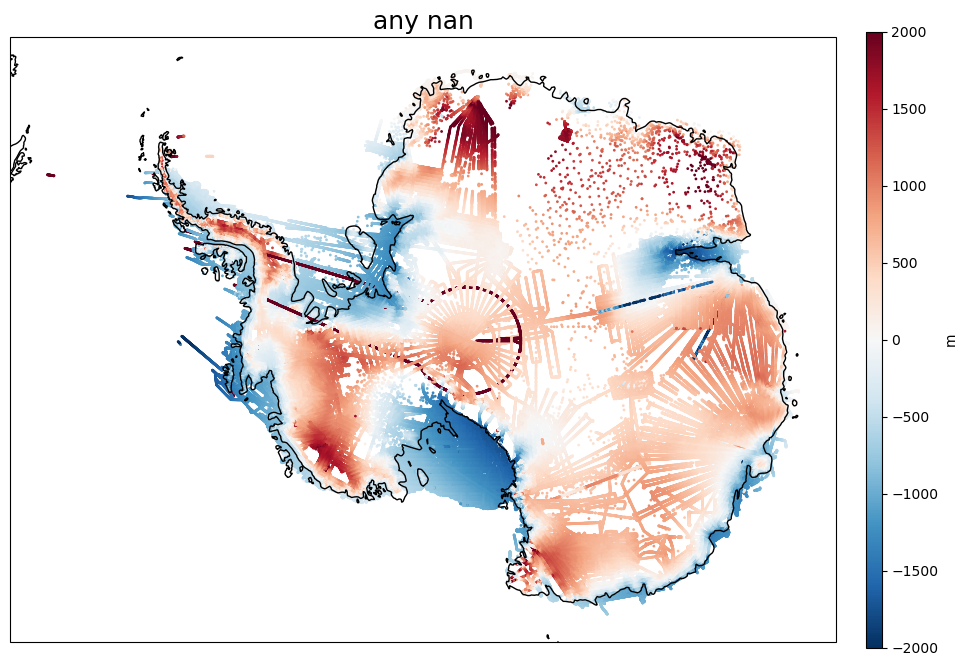

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df['longitude (degree_east)'][::100], df['latitude (degree_north)'][::100], c=df['surface_altitude (m)'][::100]-preds[::100], s=1, transform=ccrs.Geodetic(), cmap='RdBu_r', vmin=-2000, vmax=2000)
ax.axis('scaled')
ax.coastlines()
ax.set_title('any nan', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [40]:
np.count_nonzero(df['bedrock_altitude (m)'].values==-9999)

0

In [41]:
df.shape

(82555825, 15)

In [43]:
bm = xr.open_dataset(Path('D:/bedmap/bedmap3.nc'))
bm

<xarray.Dataset> Size: 5GB
Dimensions:                 (x: 13334, y: 13334)
Coordinates:
  * x                       (x) float32 53kB -3.333e+06 -3.333e+06 ... 3.333e+06
  * y                       (y) float32 53kB 3.333e+06 3.333e+06 ... -3.333e+06
Data variables:
    surface_topography      (y, x) float32 711MB ...
    bed_uncertainty         (y, x) float32 711MB ...
    bed_topography          (y, x) float32 711MB ...
    mask                    (y, x) float32 711MB ...
    ice_thickness           (y, x) float32 711MB ...
    thickness_survey_count  (y, x) float32 711MB ...
    thickness_uncertainty   (y, x) float32 711MB ...
    mapping                 <U19 76B ...
Attributes: (12/26)
    crs:                    EPSG:3031
    title:                  BEDMAP3 - Ice thickness, bed and surface elevatio...
    summary:                We present here Bedmap3, the latest suite of grid...
    keywords:               Antarctica,BEDMAP,Elevation,Ice thickness
    Conventions:            ACDD-1.3, CF-1.8
    citation:               Pritchard, H., Fretwell, P., Fremand, A., Bodart,...
    ...                     ...
    time_coverage_end:      2024-11-01
    geospatial_lon_min:     -180
    geospatial_lon_max:     180
    geospatial_lat_min:     -90
    geospatial_lat_max:     -60
    geospatial_bounds_crs:  EPSG:4326

In [44]:
bm.x.values[1] - bm.x.values[0]

np.float32(500.0)

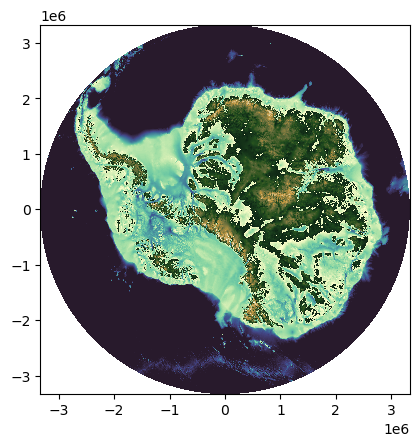

In [45]:
plt.pcolormesh(bm.x, bm.y, bm.bed_topography, cmap='cmo.topo', vmin=-3000, vmax=3000)
plt.axis('scaled')
plt.show()

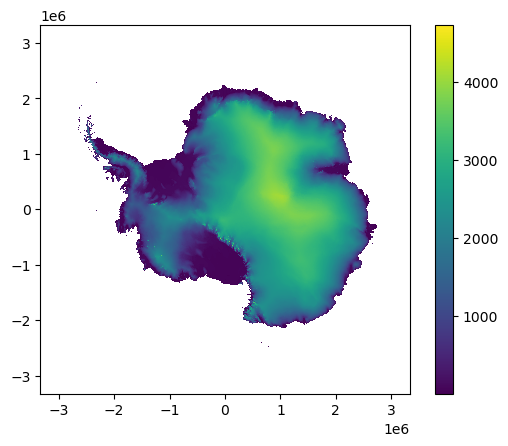

In [46]:
plt.pcolormesh(bm.x, bm.y, bm.surface_topography, cmap='viridis')
plt.axis('scaled')
plt.colorbar()
plt.show()

In [47]:
xx, yy = np.meshgrid(bm.x, bm.y)

kn = vd.KNeighbors(k=1)
kn.fit((xx.flatten(), yy.flatten()), bm.surface_topography.values.flatten())
preds = kn.predict((df.x, df.y))
preds.shape

(82555825,)

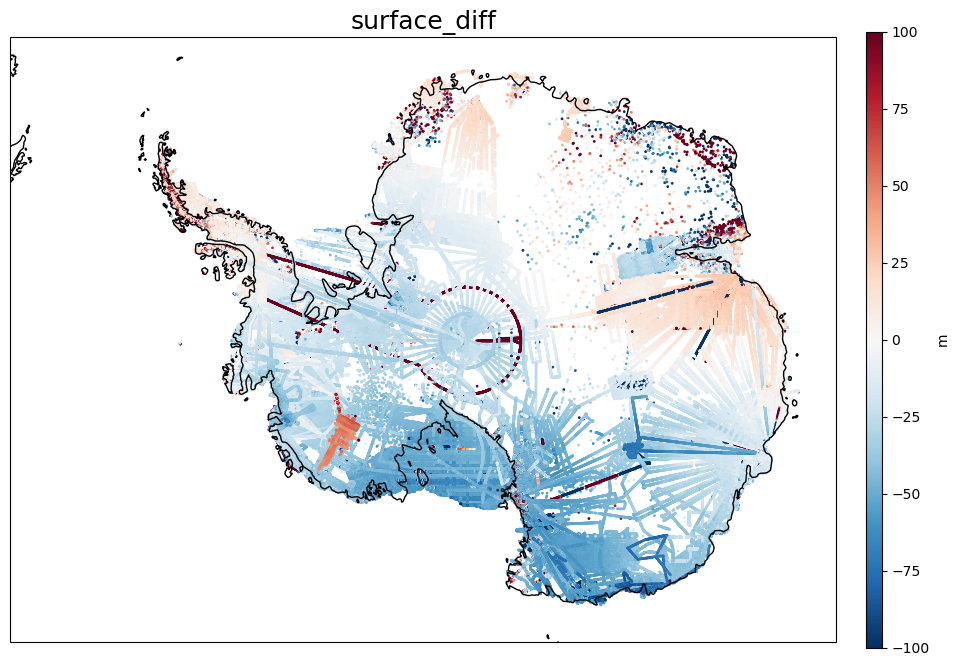

In [48]:
surface_diff = df['surface_altitude (m)'][::100]-preds[::100]

fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=surface_diff, s=1, transform=ps71, cmap='RdBu_r', vmin=-100, vmax=100)
ax.axis('scaled')
ax.coastlines()
ax.set_title('surface_diff', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

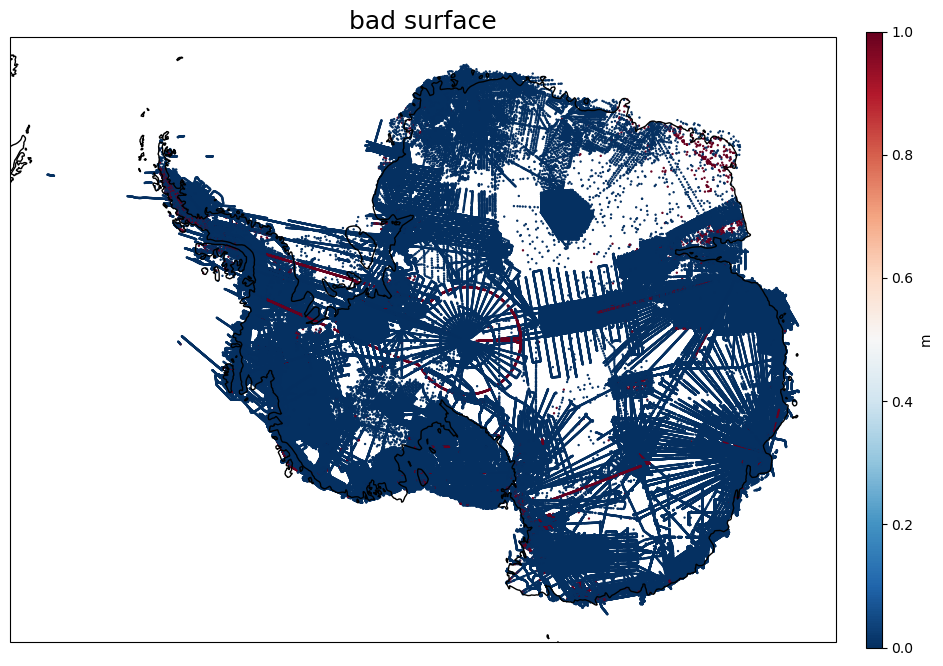

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=(np.abs(surface_diff) > 100), s=0.5, transform=ps71, cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('bad surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

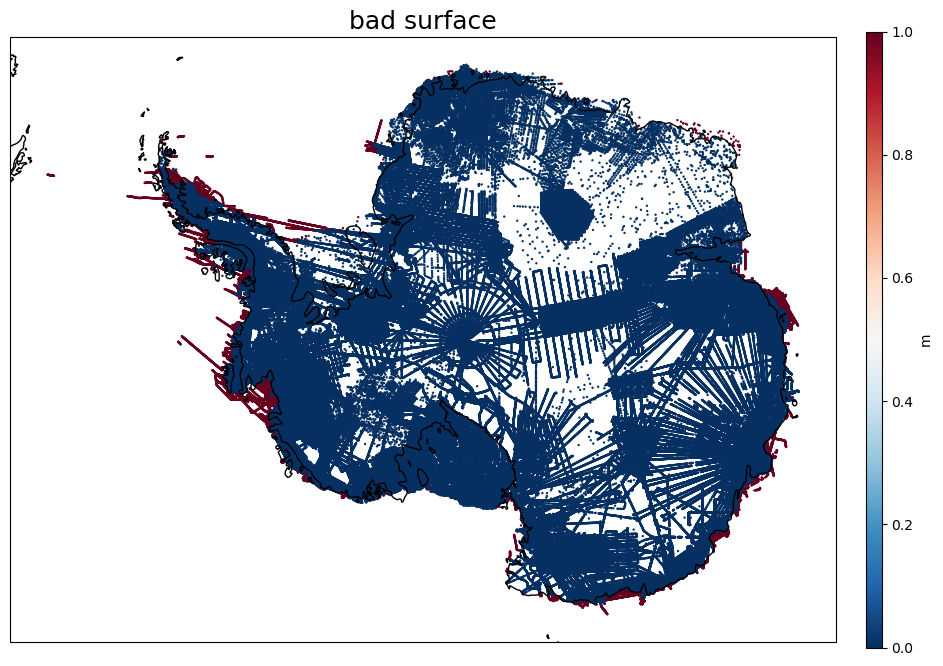

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=np.isnan(preds)[::100], s=0.5, transform=ps71, cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('bad surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

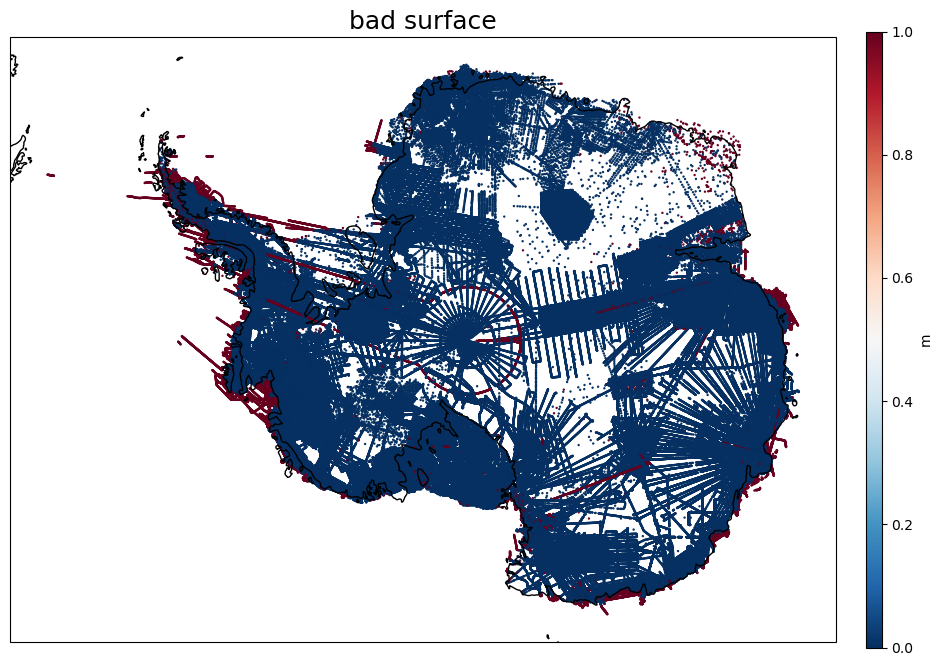

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=(np.abs(surface_diff) > 100) | np.isnan(preds)[::100], s=0.5, transform=ps71, cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('bad surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [52]:
prev_shape = df.shape[0]
df = df.loc[(np.abs(df['surface_altitude (m)'].values-preds)<100) | (df['surface_altitude (m)'].isna()==True), :]
print(f'{prev_shape-df.shape[0]:,} points removed')

4209647 points removed


In [62]:
np.count_nonzero((np.abs(surface_diff) > 100) | np.isnan(preds)[::100])

44685

### find bad ice thickness

In [53]:
kn = vd.KNeighbors(k=1)
kn.fit((xx.flatten(), yy.flatten()), bm.ice_thickness.values.flatten())
preds_thick = kn.predict((df.x, df.y))

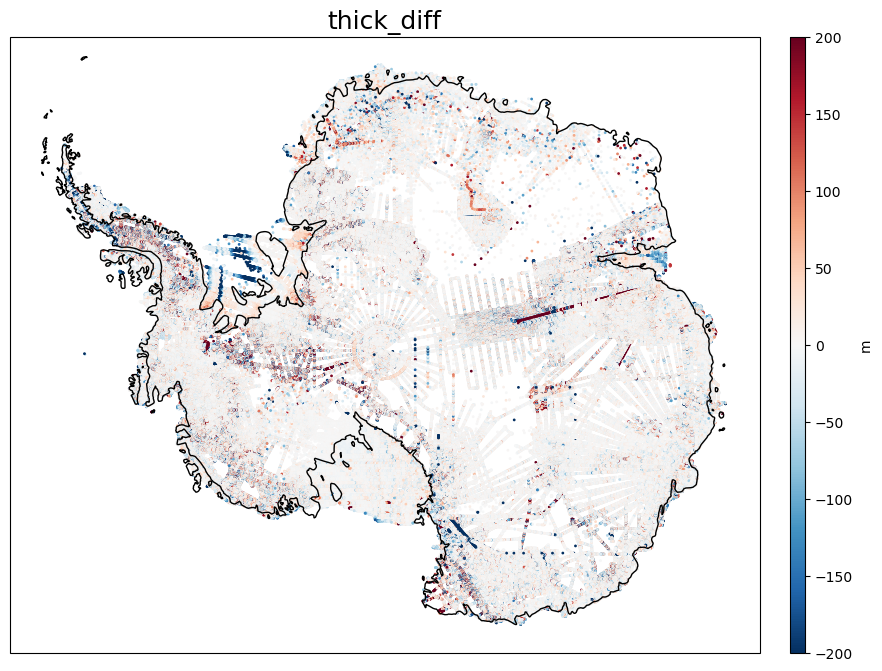

In [55]:
thick_diff = df['land_ice_thickness (m)'][::100]-preds_thick[::100]

fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=thick_diff, s=1, transform=ps71, cmap='RdBu_r', vmin=-200, vmax=200)
ax.axis('scaled')
ax.coastlines()
ax.set_title('thick_diff', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

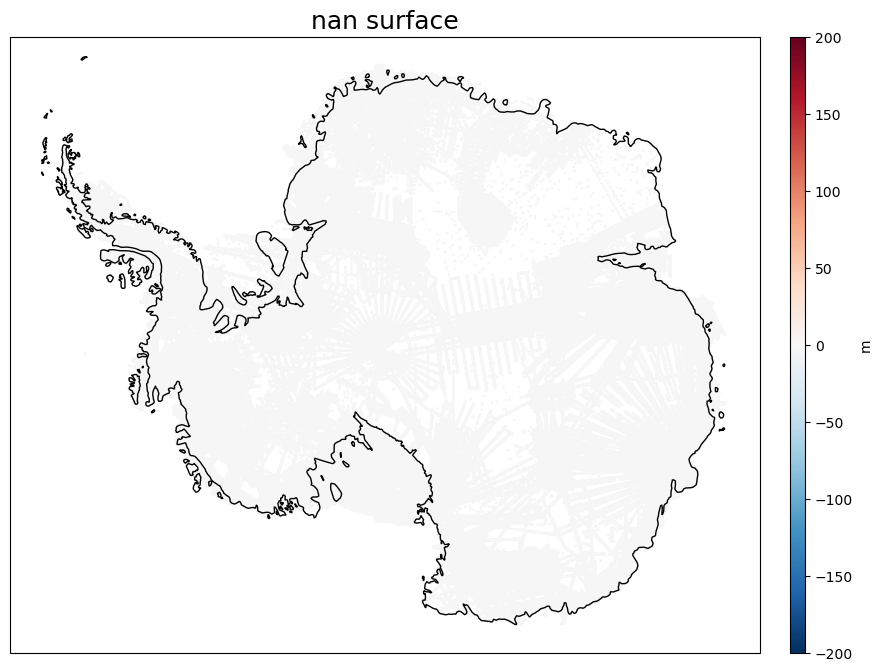

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=df['surface_altitude (m)'].isna()[::100], s=1, transform=ps71, cmap='RdBu_r', vmin=-200, vmax=200)
ax.axis('scaled')
ax.coastlines()
ax.set_title('nan surface', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

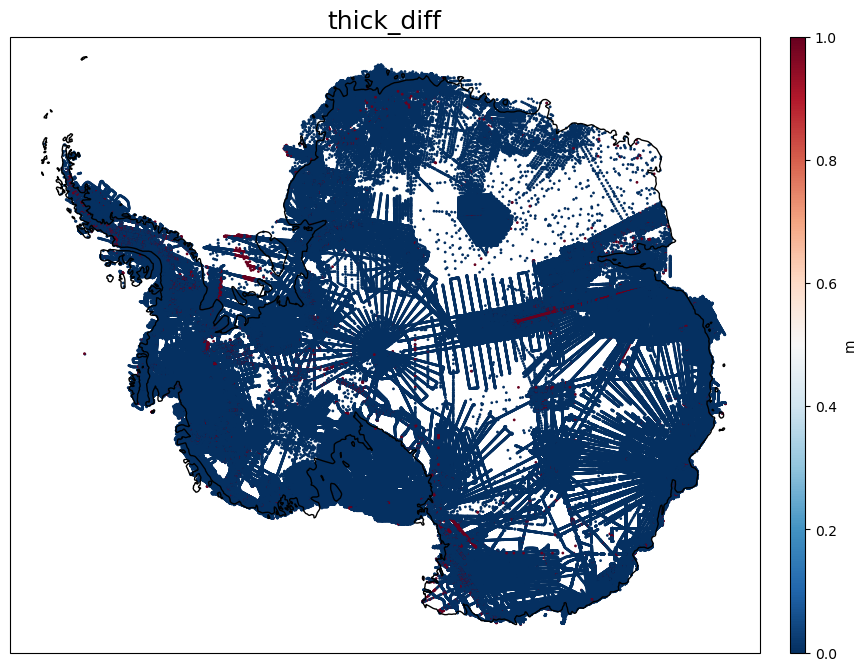

In [61]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=np.abs(thick_diff)>200, s=1, transform=ps71, cmap='RdBu_r')
ax.axis('scaled')
ax.coastlines()
ax.set_title('thick_diff', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [52]:
prev_shape = df.shape[0]
df = df.loc[np.abs(df['land_ice_thickness (m)'].values-preds_thick)<200, :]
print(f'{prev_shape-df.shape[0]:,} points removed')

1375417 points removed


In [53]:
df.shape

(76970761, 15)

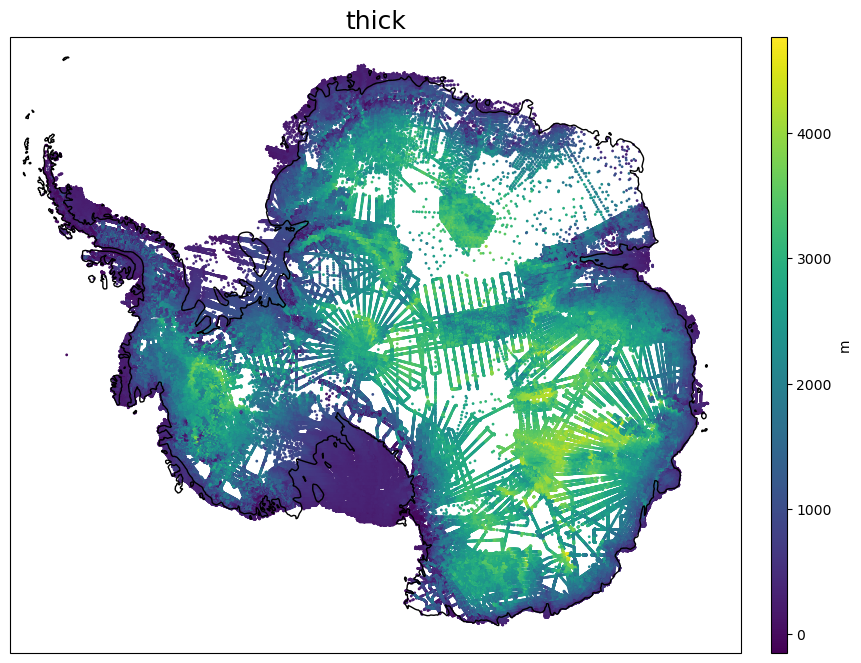

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(13,8), subplot_kw=dict(projection=ps71))
im = ax.scatter(df.x[::100], df.y[::100], c=df['land_ice_thickness (m)'][::100], s=1, transform=ps71)
ax.axis('scaled')
ax.coastlines()
ax.set_title('thick', fontsize=18)
plt.colorbar(im, pad=0.03, aspect=40, label='m')

plt.show()

In [55]:
df.head()

,trajectory_id,trace_number,longitude (degree_east),latitude (degree_north),date,time_UTC,surface_altitude (m),land_ice_thickness (m),bedrock_altitude (m),two_way_travel_time (m),aircraft_altitude (m),along_track_distance (m),bm,x,y
0,1,NaN,4.449,-75.623,NaN,NaN,NaN,2650.0,NaN,NaN,NaN,NaN,1.0,121788.567945,1.565282e+06
1,2,NaN,4.438,-75.621,NaN,NaN,NaN,2628.0,NaN,NaN,NaN,NaN,1.0,121505.125021,1.565526e+06
2,3,NaN,4.425,-75.619,NaN,NaN,NaN,2620.0,NaN,NaN,NaN,NaN,1.0,121166.937514,1.565773e+06
3,4,NaN,4.420,-75.619,NaN,NaN,NaN,2635.0,NaN,NaN,NaN,NaN,1.0,121030.297575,1.565784e+06
4,5,NaN,4.407,-75.617,NaN,NaN,NaN,2646.0,NaN,NaN,NaN,NaN,1.0,120691.982493,1.566031e+06


In [62]:
xmin = bm.x.min().values - 250
xmax = bm.x.max().values + 250
ymin = bm.y.min().values - 250
ymax = bm.y.max().values + 250
region = [xmin, xmax, ymin, ymax]
region

[np.float32(-3333500.0),
 np.float32(3333500.0),
 np.float32(-3333500.0),
 np.float32(3333500.0)]

In [57]:
(region[1]-region[0])/500

np.float32(13333.0)

In [63]:
%%time

block = vd.BlockReduce(region=region, spacing=500, adjust='region', center_coordinates=True, reduction=np.median)
block_coords, block_data = block.filter((df.x.values, df.y.values), df['land_ice_thickness (m)'].values)

CPU times: total: 2min 53s
Wall time: 2min 53s


In [64]:
block_coords[0]

array([1081250., 1081250., 1080750., ...,  -11250.,  -10750.,  -10250.])

In [69]:
def xy_into_grid_new(gridx, gridy, coords, values, fill=np.nan, quiet=False):
    """
    Place tabular data that is colocated with grid coordinates inside of grid.

    Args:
        ds : xarray.Dataset with grid coordinates
        coords : tuple of tabular coordinates, e.g., (x, y)
        values : tuple of values correspondin to coords, e.g., (var1, var2)
        fill : value to fill in grid where there are no values
        ydim : int corresponding to axis representing y-dimension in grid
        xdim : int corresponding to axis representing x-dimension in grid
    Outputs:
        if multiple arrays in values, returns a tuple of gridded values, 
        otherwise returns single gridded array
    """
    if gridx[0] > gridx[1]:
        gridx = np.sort(gridx)
        reversex = True
    else:
        reversex = False
    if gridy[0] > gridy[1]:
        gridy = np.sort(gridy)
        reversey = True
    else:
        reversey = False
    
    values = np.array(values)
    if len(values.shape)==1:
        values = np.expand_dims(values, axis=0)
        
    arr = np.full((len(values), len(gridy), len(gridx)), fill)
    
    for i in tqdm(range(len(coords[0])), disable=quiet):
        xi = coords[0][i]
        yi = coords[1][i]
        xind = np.searchsorted(gridx, xi)
        yind = np.searchsorted(gridy, yi)
        if (xind < len(gridx)) & (yind < len(gridy)):
            if (gridx[xind] == xi) & (gridy[yind] == yi):
                if reversex == True:
                    xind = len(gridx) - xind - 1
                if reversey == True:
                    yind = len(gridy) - yind - 1
                arr[:,yind, xind] = values[:,i].squeeze()
    if arr.shape[0]>1:
        return tuple(arr)
    else:
        return arr.squeeze()

In [70]:
tmp_grid = xy_into_grid_new(bm.x.values, bm.y.values, block_coords, block_data, quiet=True)

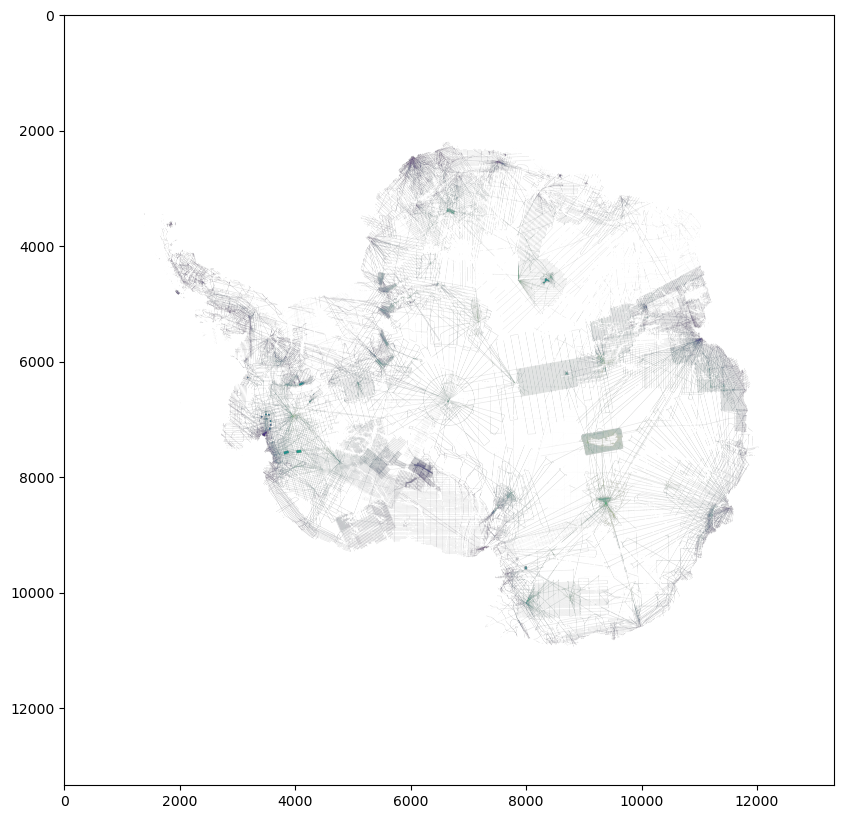

In [68]:
plt.figure(figsize=(10,10))
plt.imshow(tmp_grid)
plt.show()

In [61]:
bm.x

<xarray.DataArray 'x' (x: 13334)> Size: 53kB
array([-3333250., -3332750., -3332250., ...,  3332250.,  3332750.,  3333250.],
      dtype=float32)
Coordinates:
  * x        (x) float32 53kB -3.333e+06 -3.333e+06 ... 3.333e+06 3.333e+06
Attributes:
    units:          meters
    standard_name:  projection_x_coordinate
    long_name:      X coordinate in projected system (EPSG:3031)

In [59]:
block_coords[0].shape

(3607061,)

In [60]:
np.min(block_coords[0])

np.float64(-2645000.0)

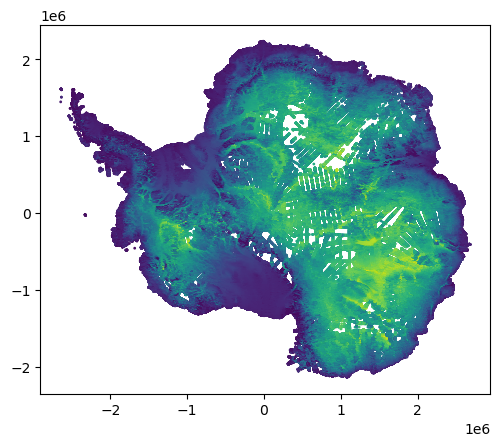

In [61]:
plt.scatter(block_coords[0], block_coords[1], c=block_data, s=1)
plt.axis('scaled')
plt.show()

In [64]:
np.unique(block_coords[0]).shape

(10417,)

In [65]:
np.unique(block_coords[1]).shape

(8745,)

In [66]:
xx.shape

(13334, 13334)

In [67]:
block_data.shape

(3607061,)

In [69]:
bm.ice_thickness.values.flatten().size

177795556

In [70]:
%%time

pred_coords = (xx.flatten(), yy.flatten())

kn = vd.KNeighbors(k=1)
kn.fit(block_coords, block_data)
kn_preds = kn.predict(pred_coords)


CPU times: total: 17min 31s
Wall time: 17min 31s


In [71]:
%%time

msk = vd.distance_mask(block_coords, maxdist=500, coordinates=pred_coords)

thick_grid = np.where(msk, kn_preds, np.nan).reshape(xx.shape)
thick_grid.shape

CPU times: total: 15min 53s
Wall time: 15min 53s


(13334, 13334)

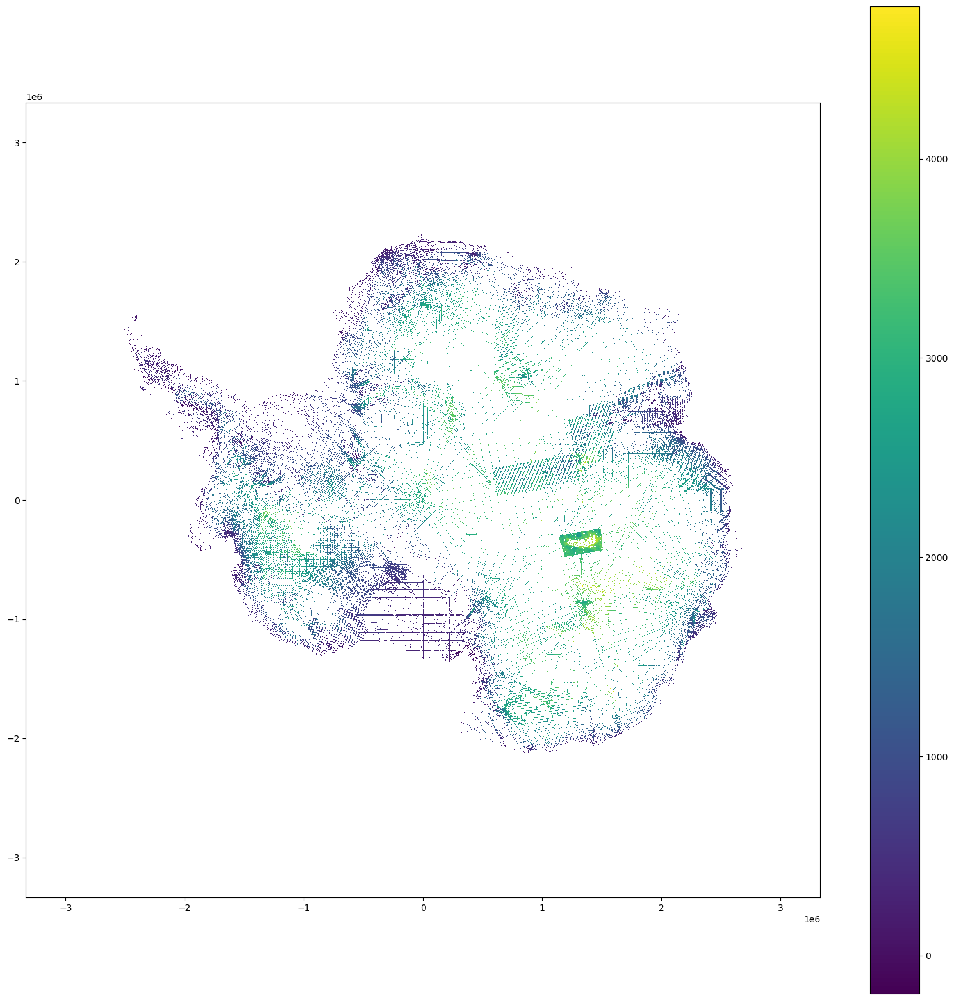

In [89]:
plt.figure(figsize=(20,20))
plt.pcolormesh(bm.x, bm.y, thick_grid)
plt.axis('scaled')
plt.colorbar()
plt.show()

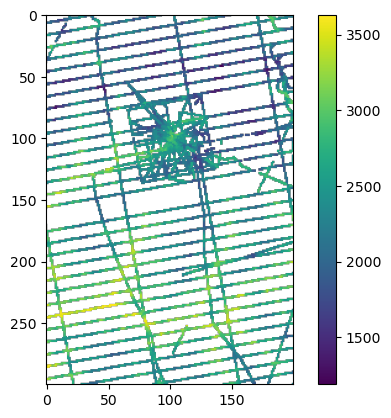

In [84]:
plt.imshow(thick_grid[6100:6400,8600:8800])
plt.colorbar()
plt.show()

In [87]:
bed_grid = bm.surface_topography.values - thick_grid

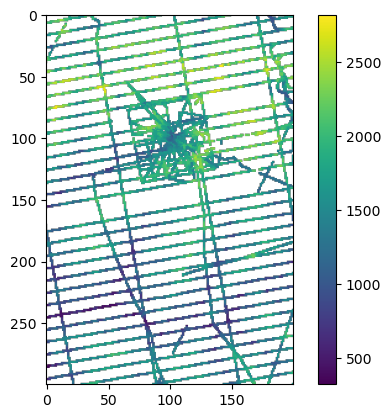

In [88]:
plt.imshow(bed_grid[6100:6400,8600:8800])
plt.colorbar()
plt.show()

In [90]:
np.save(Path('D:/bedmap3_raw_thick_compilation.npy'), thick_grid)

In [91]:
bm

<xarray.Dataset> Size: 5GB
Dimensions:                 (x: 13334, y: 13334)
Coordinates:
  * x                       (x) float32 53kB -3.333e+06 -3.333e+06 ... 3.333e+06
  * y                       (y) float32 53kB 3.333e+06 3.333e+06 ... -3.333e+06
Data variables:
    surface_topography      (y, x) float32 711MB nan nan nan nan ... nan nan nan
    bed_uncertainty         (y, x) float32 711MB ...
    bed_topography          (y, x) float32 711MB nan nan nan nan ... nan nan nan
    mask                    (y, x) float32 711MB ...
    ice_thickness           (y, x) float32 711MB nan nan nan nan ... nan nan nan
    thickness_survey_count  (y, x) float32 711MB ...
    thickness_uncertainty   (y, x) float32 711MB ...
    mapping                 <U19 76B ...
Attributes: (12/26)
    crs:                    EPSG:3031
    title:                  BEDMAP3 - Ice thickness, bed and surface elevatio...
    summary:                We present here Bedmap3, the latest suite of grid...
    keywords:               Antarctica,BEDMAP,Elevation,Ice thickness
    Conventions:            ACDD-1.3, CF-1.8
    citation:               Pritchard, H., Fretwell, P., Fremand, A., Bodart,...
    ...                     ...
    time_coverage_end:      2024-11-01
    geospatial_lon_min:     -180
    geospatial_lon_max:     180
    geospatial_lat_min:     -90
    geospatial_lat_max:     -60
    geospatial_bounds_crs:  EPSG:4326

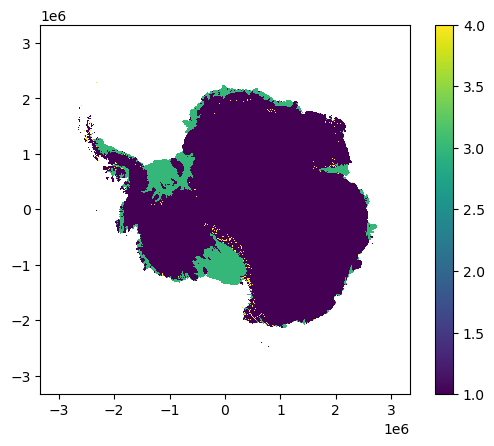

In [92]:
plt.pcolormesh(bm.x, bm.y, bm.mask)
plt.axis('scaled')
plt.colorbar()
plt.show()

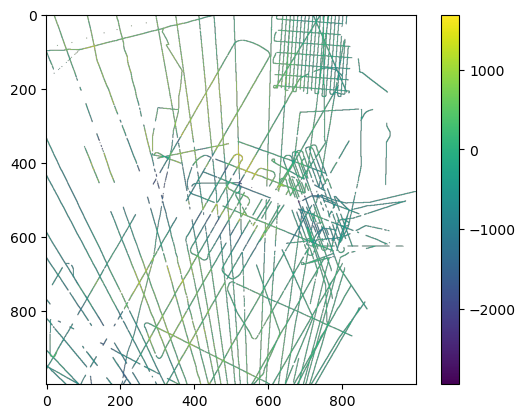

In [103]:
plt.imshow(bed_grid[7000:8000,11000:12000])
plt.colorbar()
plt.show()

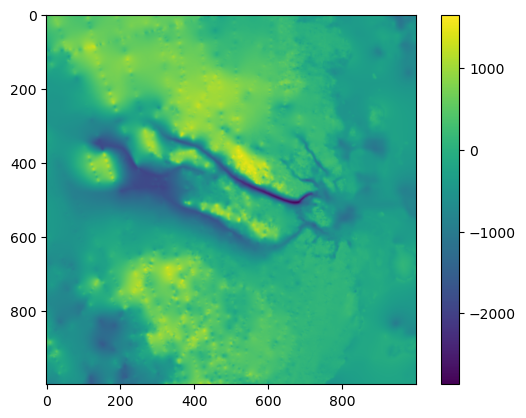

In [101]:
plt.imshow(bm.bed_topography.values[7000:8000,11000:12000])
plt.colorbar()
plt.show()

In [102]:
np.min(bm.bed_topography.values[7000:8000,11000:12000])

np.float32(-2870.0)

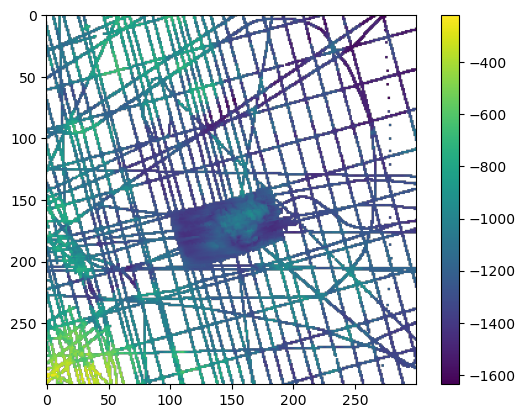

In [111]:
plt.imshow(bed_grid[7400:7700,3700:4000])
plt.colorbar()
plt.show()

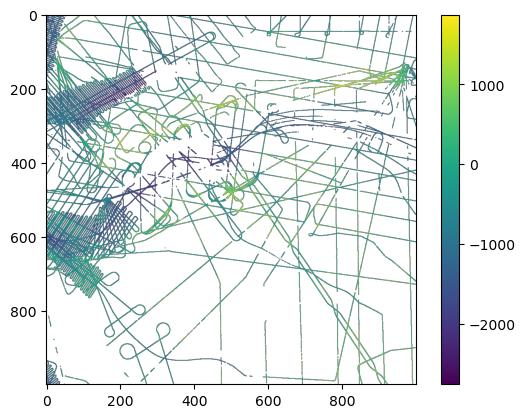

In [116]:
plt.imshow(bed_grid[4500:5500,5500:6500])
plt.colorbar()
plt.show()

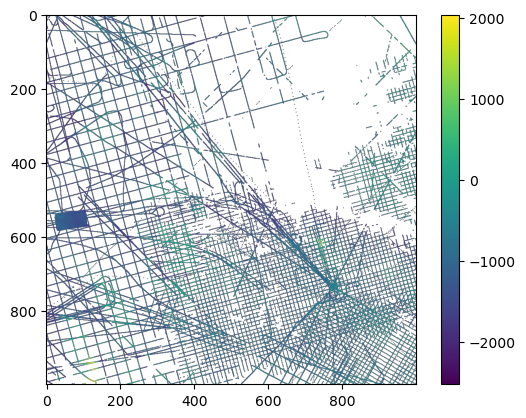

In [121]:
plt.imshow(bed_grid[7000:8000,4000:5000])
plt.colorbar()
plt.show()

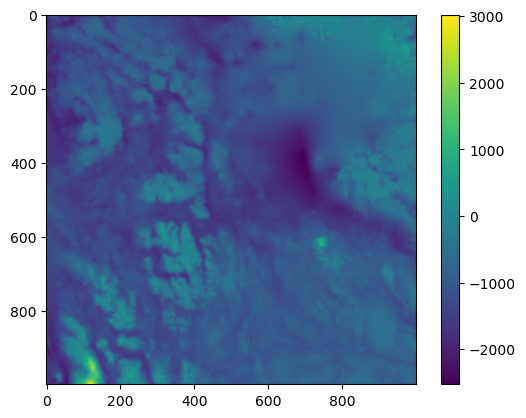

In [122]:
plt.imshow(bm.bed_topography.values[7000:8000,4000:5000])
plt.colorbar()
plt.show()

# Add geoid to bedmap3

In [ ]:
bm_path = Path('G:/stochastic_bathymetry/raw_data/bedmachine/BedMachineAntarctica-v3.nc')
bm = xr.open_dataset(bm_path)
#bm = bm.coarsen(x=10, y=10, boundary='trim').mean()
bm

In [ ]:
ds = xr.open_dataset(Path('../bedmap/bedmap3.nc'))
ds

In [ ]:
%%time

xx_bm, yy_bm = np.meshgrid(bm.x, bm.y)
xx_ds, yy_ds = np.meshgrid(ds.x, ds.y)

linear = vd.KNeighbors(k=1)
linear.fit((xx_bm, yy_bm), bm.geoid.values)
preds = linear.predict((xx_ds, yy_ds))

print(np.count_nonzero(np.isnan(preds)))
print(preds.shape)

In [ ]:
thick_cond = np.load(Path('../bedmap/bedmap3_raw_thick_compilation.npy'))

In [ ]:
ds['geoid'] = (('y', 'x'), preds)
ds['bed_ell'] = (('y', 'x'), ds.bed_topography.values + preds)
ds['surface_ell'] = (('y', 'x'), ds.surface_topography.values + preds)
ds['thick_cond'] = (('y', 'x'), thick_cond)

In [ ]:
ds

In [ ]:
ds.to_netcdf(Path('../bedmap/bedmap3_mod.nc'))